# Przygotowanie

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install shap
!pip install SAlib
!pip install sklearn-relief

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 575 kB 4.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 758 kB 5.0 MB/s 
     |████████████████████████████████| 132 kB 47.5 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# importy ogólne
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from timeit import default_timer as timer
from IPython.display import clear_output
from IPython.display import display, HTML
import pickle

# importy do modeli klasyfikacji
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression

# importy do sieci neuronowych keras
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

# insterpretacja istotności
import shap

# Analiza danych

In [4]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/DataSets/Life Expectancy Data.csv')
print( data.info() )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

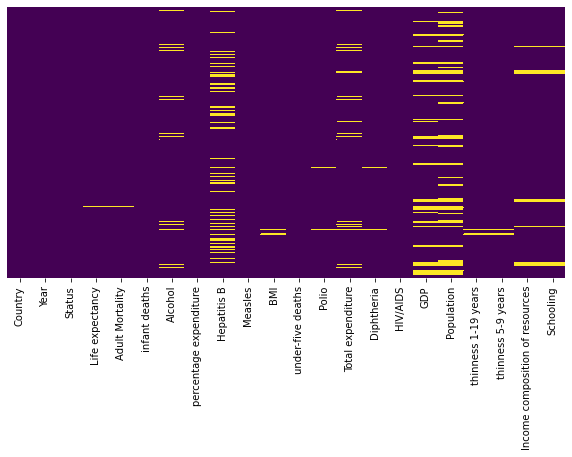

In [5]:
plt.figure( figsize=(10, 5) )
sns.heatmap(data=data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

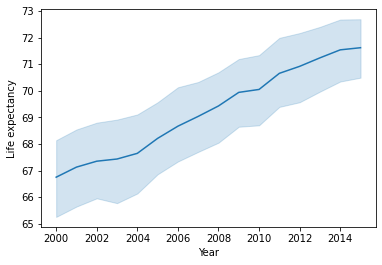

In [6]:
sns.lineplot(data=data, x='Year', y='Life expectancy')

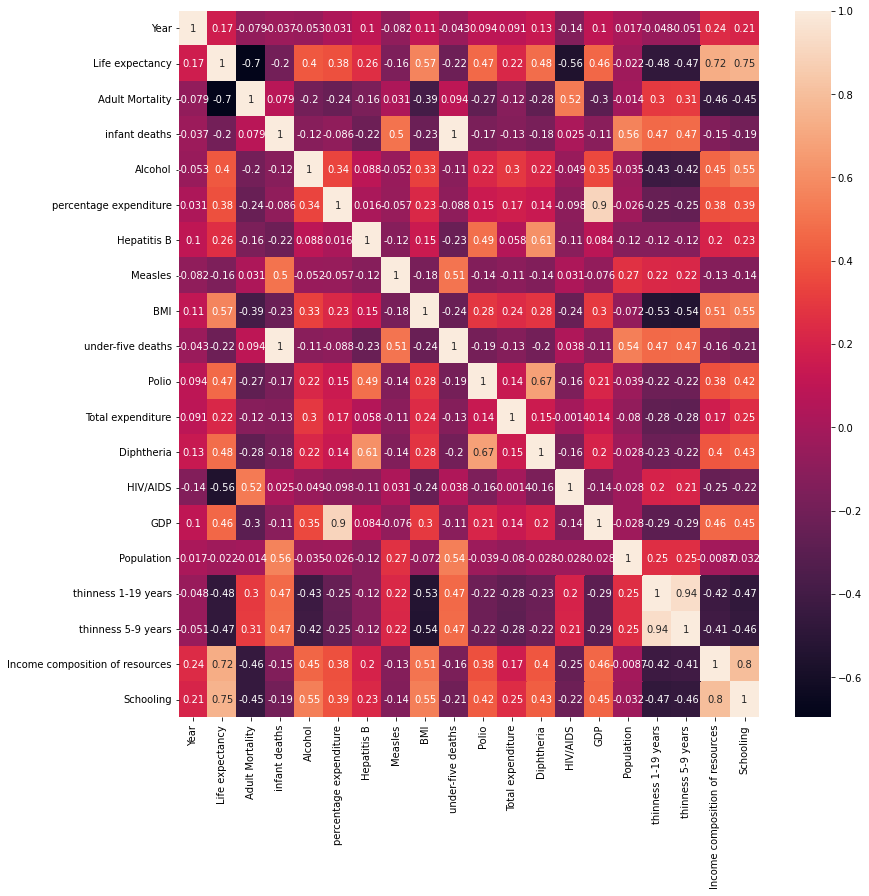

In [7]:
plt.figure( figsize=(13, 13) )
sns.heatmap(data.corr(), annot=True)

In [8]:
# zamiana kolumny 'status' na dummie wartości i wyrzycenie kolumny country
data_mod = data.dropna(axis=0).copy()
status_dummies = pd.get_dummies(data_mod['Status'], drop_first=False)
data_mod.drop('Status', axis=1, inplace=True)
data_mod = pd.concat( [data_mod, status_dummies], axis=1 )

data_mod.drop('Country', axis=1, inplace=True)
print( data_mod.info() )

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1649 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Year                             1649 non-null   int64  
 1   Life expectancy                  1649 non-null   float64
 2   Adult Mortality                  1649 non-null   float64
 3   infant deaths                    1649 non-null   int64  
 4   Alcohol                          1649 non-null   float64
 5   percentage expenditure           1649 non-null   float64
 6   Hepatitis B                      1649 non-null   float64
 7   Measles                          1649 non-null   int64  
 8   BMI                              1649 non-null   float64
 9   under-five deaths                1649 non-null   int64  
 10  Polio                            1649 non-null   float64
 11  Total expenditure                1649 non-null   float64
 12  Diphtheria          

In [9]:
print( data_mod['Year'].unique() )

[2015 2014 2013 2012 2011 2010 2009 2008 2007 2006 2005 2004 2003 2002
 2001 2000]


In [10]:
# rozbicie danych na zestaw uczacy i testujacy
Y = data_mod['Life expectancy']
X = data_mod.drop('Life expectancy', axis=1)
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=101)

# resetowanie indeksu dla scaled x_train, x_test
y_train = pd.DataFrame(y_train.reset_index()).drop('index', axis=1)
y_test = pd.DataFrame(y_test.reset_index()).drop('index', axis=1)

scaler = MinMaxScaler()
scaler.fit( x_train )
# zeskalowane dane ze zresetowanym indeksem
x_train = pd.DataFrame( scaler.transform(x_train), columns=x_train.columns )
x_test = pd.DataFrame( scaler.transform(x_test), columns=x_test.columns )

test_sorted = pd.concat([x_test, y_test], axis=1, ignore_index=False).copy()
test_sorted.sort_values(by='Life expectancy', inplace=True)
test_sorted.reset_index(inplace=True)
test_sorted.drop('index', axis=1, inplace=True)

# Model drzewa dezycyjnego

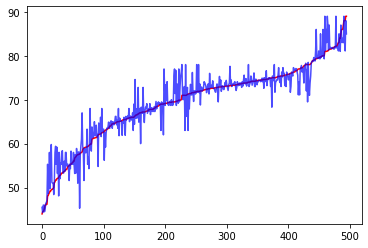

In [ ]:
dtree_model = DecisionTreeRegressor()
dtree_model.fit(x_train, y_train)

y_pred = dtree_model.predict(test_sorted.drop('Life expectancy', axis=1))

plt.plot( test_sorted.index, test_sorted['Life expectancy'], color='red')
plt.plot( test_sorted.index, y_pred, color='blue', alpha=0.7)

2.74211081416702


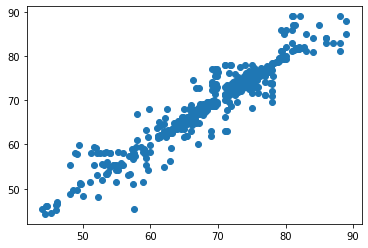

In [ ]:
plt.scatter( test_sorted['Life expectancy'], y_pred )
print( np.sqrt(mean_squared_error(test_sorted['Life expectancy'], y_pred) ) )

In [ ]:
pickle.dump(dtree_model, open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_DTREE.sav', 'wb'))

# Model randomowych lasów

In [ ]:
# sprawdzenie kilku modelow randomowych lasow

rmse = []
est_num = [ i*50 for i in range(1,31)]
for n in est_num:
    forest_model = RandomForestRegressor(n_estimators=n)
    forest_model.fit(x_train, y_train)
    y_pred = forest_model.predict(x_test)
    rmse.append( np.sqrt(mean_squared_error(y_test, y_pred)) )
    
    clear_output(wait=True)
    print( n )


1500


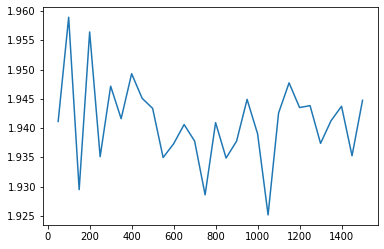

In [ ]:
# wyrysowanie zależności błędu od ilości drzew w modelu
plt.plot(est_num, rmse)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


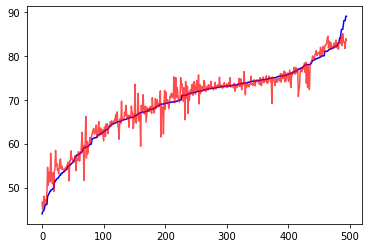

In [ ]:
best_rforest = RandomForestRegressor(n_estimators=500)
best_rforest.fit(x_train, y_train)

test_sorted = pd.concat([x_test, y_test], axis=1).copy()
test_sorted.sort_values(by='Life expectancy', inplace=True)
test_sorted.reset_index(inplace=True)
test_sorted.drop('index', axis=1, inplace=True)

y_pred = best_rforest.predict(test_sorted.drop('Life expectancy', axis=1))

plt.plot(test_sorted.index, test_sorted['Life expectancy'], color='blue')
plt.plot(test_sorted.index, y_pred, color='red', alpha=0.7)

1.9341338235797296


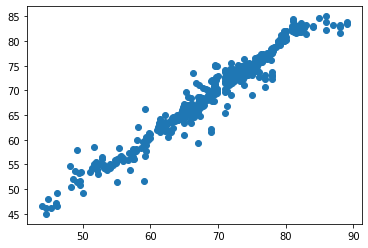

In [ ]:
plt.scatter(test_sorted['Life expectancy'], y_pred)
print( np.sqrt(mean_squared_error(test_sorted['Life expectancy'], y_pred)) )

In [ ]:
pickle.dump(best_rforest, open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_RFOREST.sav', 'wb'))



# Model MLP

In [ ]:
# tworzenie modelu mlp
nn_model = Sequential()
nn_model.add( Dense(40, input_dim=21, activation='relu') )
nn_model.add( Dense(20, activation='linear') )
nn_model.add( Dense(20, activation='relu') )
nn_model.add( Dense(1, activation='relu') )

nn_model.compile(loss='mse', optimizer='adam')
stop_early = EarlyStopping(monitor='val_loss', patience=25, mode='min')


In [ ]:
nn_model.fit(x_train, y_train, epochs=2000, batch_size=16, verbose=1, validation_data=(x_test, y_test), callbacks=[stop_early])

Epoch 1/2000
73/73 [==============================] - 1s 5ms/step - loss: 4194.0288 - val_loss: 2509.5493
Epoch 2/2000
73/73 [==============================] - 0s 3ms/step - loss: 597.3630 - val_loss: 77.9799
Epoch 3/2000
73/73 [==============================] - 0s 3ms/step - loss: 78.9711 - val_loss: 65.0375
Epoch 4/2000
73/73 [==============================] - 0s 3ms/step - loss: 67.0830 - val_loss: 57.5862
Epoch 5/2000
73/73 [==============================] - 0s 2ms/step - loss: 57.7439 - val_loss: 48.9016
Epoch 6/2000
73/73 [==============================] - 0s 3ms/step - loss: 48.4461 - val_loss: 40.2439
Epoch 7/2000
73/73 [==============================] - 0s 3ms/step - loss: 39.4595 - val_loss: 33.2744
Epoch 8/2000
73/73 [==============================] - 0s 2ms/step - loss: 31.7817 - val_loss: 27.2291
Epoch 9/2000
73/73 [==============================] - 0s 3ms/step - loss: 25.3252 - val_loss: 22.6272
Epoch 10/2000
73/73 [==============================] - 0s 3ms/step - loss: 20

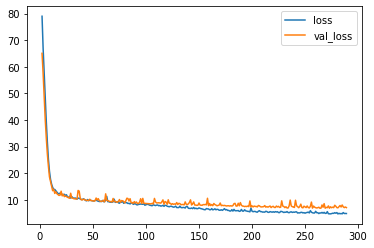

In [ ]:
pd.DataFrame(nn_model.history.history).loc[2:].plot()

16/16 [==============================] - 0s 1ms/step


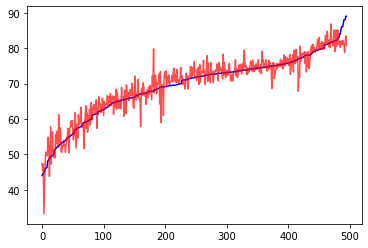

In [ ]:
y_pred = nn_model.predict(test_sorted.drop('Life expectancy', axis=1) )

plt.plot(test_sorted.index, test_sorted['Life expectancy'], color='blue')
plt.plot(test_sorted.index, y_pred, color='red', alpha=0.7)

2.6608504979638163


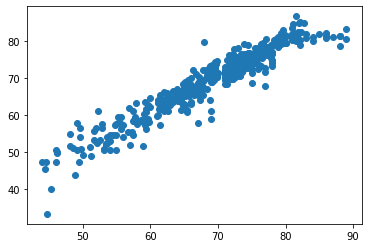

In [ ]:
plt.scatter(test_sorted['Life expectancy'], y_pred)
print( np.sqrt(mean_squared_error(test_sorted['Life expectancy'], y_pred)) )

In [ ]:
nn_model.save('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_MLP')

# Model SVM

In [ ]:
# tworzenie modelu svm przy pomocy gridsearch
grid_param = { 'C':[1, 10, 100, 1000, 10000], 'gamma' :[1, 0.1, 0.01, 0.001], 'epsilon' : [1, 0.9, 0.1, 0.01, 0.001],  'kernel': ['rbf']}

grid = GridSearchCV(SVR(), param_grid=grid_param, refit=True, verbose=True, n_jobs=-1)

In [ ]:
grid.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


GridSearchCV(estimator=SVR(), n_jobs=-1,
             param_grid={'C': [1, 10, 100, 1000, 10000],
                         'epsilon': [1, 0.9, 0.1, 0.01, 0.001],
                         'gamma': [1, 0.1, 0.01, 0.001], 'kernel': ['rbf']},
             verbose=4)

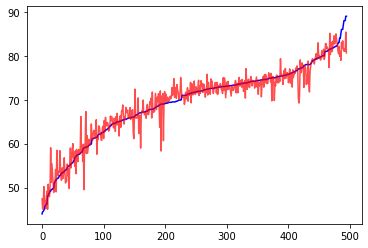

In [ ]:
y_pred = grid.predict(test_sorted.drop('Life expectancy', axis=1) )

plt.plot(test_sorted.index, test_sorted['Life expectancy'], color='blue')
plt.plot(test_sorted.index, y_pred, color='red', alpha=0.7)

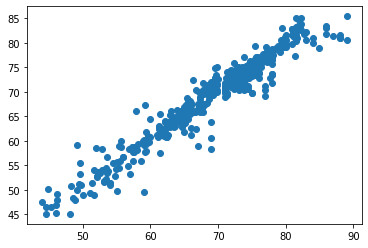

In [ ]:
plt.scatter(test_sorted['Life expectancy'], y_pred)

In [ ]:
print( grid.best_params_ )
print( np.sqrt(mean_squared_error(test_sorted['Life expectancy'], y_pred)) )

{'C': 100, 'epsilon': 0.9, 'gamma': 1, 'kernel': 'rbf'}
2.29234857147126


In [ ]:
svm_model = SVR( **grid.best_params_ )
svm_model.fit(x_train.values, y_train.values.ravel() )
pickle.dump(svm_model, open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_SVM.sav', 'wb'))

# Model regresji liniowej

In [ ]:
linearReg_model = LinearRegression()
linearReg_model.fit(x_train.values, y_train.values)

LinearRegression()

In [ ]:
y_pred = linearReg_model.predict(test_sorted.drop('Life expectancy', axis=1))

X has feature names, but LinearRegression was fitted without feature names


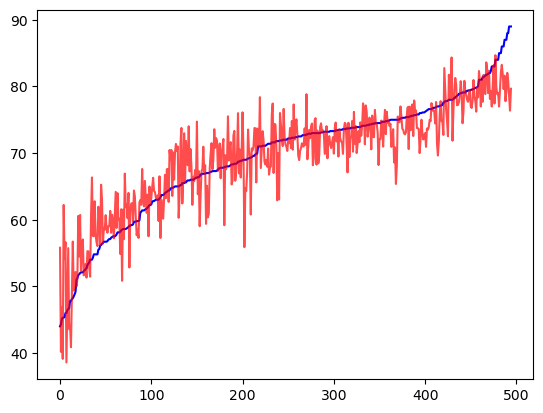

In [ ]:
plt.plot(test_sorted.index, test_sorted['Life expectancy'], color='blue')
plt.plot(test_sorted.index, y_pred, color='red', alpha=0.7)

3.8223472531265466


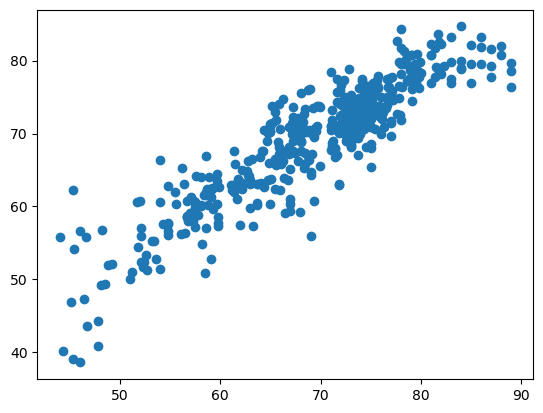

In [ ]:
plt.scatter(test_sorted['Life expectancy'], y_pred)
print( np.sqrt(mean_squared_error(test_sorted['Life expectancy'], y_pred)) )

In [ ]:
pickle.dump(linearReg_model, open('models/LifeModels/LifeExpectancy_LINEARREG.sav', 'wb'))
print(linearReg_model.coef_)

[  -2.05075889   -0.51340267  -12.44721641  142.85898086   -2.19147653
    4.23659408   -0.60533228   -2.41939405    2.53674293 -139.1332664
    0.32103914    1.14752412    1.84535231  -21.5875547     4.02466698
   -1.67760288    2.07111988   -3.68621787   10.70024316   13.671478  ]
Index(['Year', 'Status', 'Adult Mortality', 'infant deaths', 'Alcohol',
       'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness 1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')


# Analizy istotności dla wyuczonych modeli

In [11]:
#Ksamples = shap.sample(x_train, 100)
#pickle.dump(Ksamples, open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/Ksamples.sav', 'wb'))
Ksamples = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/Ksamples.sav', 'rb'))

# biblioteki dla analizy wrażliwości
from SALib.analyze import morris
from SALib.analyze import sobol 
from SALib.sample import saltelli
import tensorflow as tf
import math


# określenie problemu dla analizy wrażliwości
bounds = [ [0, 1] for i in range(21) ]
problem = {
    'num_vars' : 21,
    'names' : list(x_train.columns),
    'bounds' : bounds
}

# wyprodukowane dane do analizy wrażliwści
#param_values = saltelli.sample(problem, 1024)
#pickle.dump(param_values, open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/param_values.sav', 'wb'))
param_values = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/param_values.sav', 'rb'))


# funkcja resetująca wagi modelu mlp na losowe wartości
def reinitialize(model):
    for l in model.layers:
        if hasattr(l,"kernel_initializer"):
            l.kernel.assign(l.kernel_initializer(tf.shape(l.kernel)))
        if hasattr(l,"bias_initializer"):
            l.bias.assign(l.bias_initializer(tf.shape(l.bias)))
        if hasattr(l,"recurrent_initializer"):
            l.recurrent_kernel.assign(l.recurrent_initializer(tf.shape(l.recurrent_kernel)))

# funkcja do rysowania i analizoswania wyników modeli
def evaluate_models(features, models, params_for_model_fitting = {}, model_builder=None, amounts=10) -> None:
  '''
  funkcja mająca na celu wytrenować kolejny model z listy
  używając co iteracje nowego modelu i pomniejszonej liczby atrybutów.
  Na sam koniec wyrysowując dopasowanie modelu i 
  wypisując sqrt(mse) oraz mae
  '''

  # zbiór danych do odrzucania najmniej znaczącyh
  relief_x_train = x_train
  relief_x_test = x_test
  relief_test_sorted = test_sorted
  model_avg_scores = []

  fig, axes = plt.subplots( len(features), figsize=(14, 120) )

  for i, ax in enumerate(axes):
    # usunięcie kolejnego atrybutu
    if( i > 0 ):
      relief_x_train = relief_x_train.drop( features.index[i-1], axis=1 )
      relief_x_test = relief_x_test.drop( features.index[i-1], axis=1 )
      relief_test_sorted = relief_test_sorted.drop( features.index[i-1], axis=1 )

    # wytrenowanie modelu 10-krotnie i zebranie wartości błędu
    scores = []
    best_score = math.inf
    best_model = None
    best_weights_for_mlp = None
    threshold = 65.0
    for dummie in range(amounts):
      print(f'Uczę {dummie}-ty model dla {len(relief_x_train.columns.values)} atrybutów')
      clear_output(wait=True)
      met_threshold = False
      # czasem mlp przestaje się uczyć przy błędzie ok 70 dla takiego przypadku powtarzam naukę
      while ( not met_threshold ):
        if (model_builder):
          models[i] = model_builder()
          models[i].fit(relief_x_train, y_train.values.ravel())
        else:
          reinitialize(models[i])
          models[i].fit(relief_x_train, y_train, **params_for_model_fitting)
        y_pred = models[i].predict(relief_x_test)
        score = np.sqrt(mean_squared_error(y_test, y_pred))
        
        if ( score < best_score ):
          best_score = score
          if(model_builder):
            best_model = models[i]
          else:
            best_weights_for_mlp = models[i].get_weights()
        if( score < threshold ):
          met_threshold = True
          mae = mean_absolute_error(y_test, y_pred)
          scores.append( [score, mae] )
          #print( f'bez powtorki: {score}')
        else:
          #print( f'powtorka: {score}')
          pass

    model_avg_scores.append( np.mean(np.array(scores), axis=0) )

    if(model_builder):
      models[i] = best_model
    else:
      models[i].set_weights(best_weights_for_mlp)

    y_pred = models[i].predict(relief_x_test)
    # napis z metrykami
    text = f'rmse: {np.sqrt(mean_squared_error(y_test, y_pred)):0.4f}\nmae: {mean_absolute_error(y_test, y_pred):0.4f}'

    y_pred = models[i].predict(relief_test_sorted.drop('Life expectancy', axis=1))
    ax.set_title( f'Wykres dopasowania\n{len(relief_x_train.columns.values)} atrybutów' )
    ax.plot( test_sorted.index, y_pred, color='blue', alpha=0.7 )
    ax.plot( test_sorted.index, test_sorted['Life expectancy'], color='red')
    ax.text( 0.5, 0.2, text, transform=ax.transAxes, size=15,)

  print( "########## AVG SCORES ########")
  for avg_s in model_avg_scores:
    print( f'avg rmse: {avg_s[0]:7.3f} | mae: {avg_s[1]:7.3f} ' )
  print( "########## AVG SCORES ########")

# klasy zwracające instancje modelów 
class dtree_builder:
  def __call__(self):
    return DecisionTreeRegressor()

class rforest_builder:
  def __call__(self):
    return RandomForestRegressor(n_estimators=500)

class svm_builder:
  def __call__(self):
    return SVR(C=100, epsilon=0.9, gamma=1, kernel='rbf')


attributes_dict = {}
for i, attr in enumerate(x_train.columns.values):
  attributes_dict[attr] = str(i)
  print(f'{attr} : {i}')

Year : 0
Adult Mortality : 1
infant deaths : 2
Alcohol : 3
percentage expenditure : 4
Hepatitis B : 5
Measles : 6
BMI : 7
under-five deaths : 8
Polio : 9
Total expenditure : 10
Diphtheria : 11
HIV/AIDS : 12
GDP : 13
Population : 14
thinness 1-19 years : 15
thinness 5-9 years : 16
Income composition of resources : 17
Schooling : 18
Developed : 19
Developing : 20


# 0. Analiza RReliefF

In [55]:
from sklearn_relief import RReliefF

rel = RReliefF(n_features=20, n_iterations=200)
rel.fit( x_train.values, y_train.values.reshape(-1) )

RReliefF()

Text(0.5, 1.0, 'Wartości wag dla atrybutów')

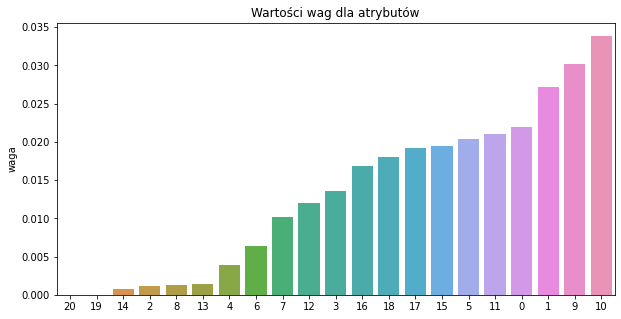

In [56]:
features_relief = rel.w_
x_columns = x_train.columns

fig, ax = plt.subplots(figsize=(10, 5))
features_relief = pd.DataFrame(np.abs(features_relief.reshape(-1, 1)), index=x_columns, columns=['waga'])
features_relief.sort_values('waga', ascending=True, inplace=True)
attr_nums = [attributes_dict[att] for att in features_relief.index ]
sns.barplot(data=features_relief, x=attr_nums, y='waga')

'''
for i, p in enumerate(ax.patches):
    h, w, x = p.get_height(), p.get_width(), p.get_x()
    xy = (x + w / 2., h + 0.003)
    value = features_relief.iloc[i].values[0]
    text = f'{value:0.2e}'
    ax.annotate(s=text, xy=xy, ha='center', va='center')
'''

ax.set_title('Wartości wag dla atrybutów')

Model Drzewa Decyzyjnego

########## AVG SCORES ########
avg rmse:   2.769 | mae:   1.742 
avg rmse:   2.793 | mae:   1.749 
avg rmse:   2.767 | mae:   1.732 
avg rmse:   2.817 | mae:   1.745 
avg rmse:   2.771 | mae:   1.724 
avg rmse:   2.685 | mae:   1.668 
avg rmse:   2.669 | mae:   1.664 
avg rmse:   2.579 | mae:   1.555 
avg rmse:   2.607 | mae:   1.587 
avg rmse:   2.600 | mae:   1.552 
avg rmse:   2.999 | mae:   1.772 
avg rmse:   2.967 | mae:   1.741 
avg rmse:   2.913 | mae:   1.733 
avg rmse:   2.929 | mae:   1.714 
avg rmse:   3.095 | mae:   1.845 
avg rmse:   5.200 | mae:   2.528 
avg rmse:   4.825 | mae:   2.454 
avg rmse:   4.747 | mae:   2.579 
avg rmse:   3.894 | mae:   2.475 
avg rmse:   9.732 | mae:   6.830 
avg rmse:  11.060 | mae:   8.437 
########## AVG SCORES ########


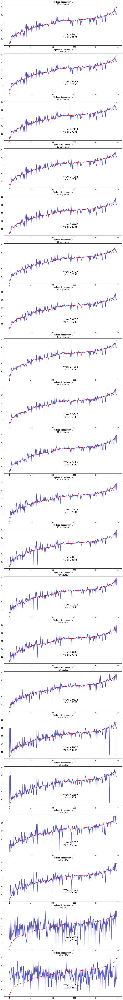

In [57]:
dtree_models = []
for i in range(len(features_relief)):
  dtree_models.append( DecisionTreeRegressor() )

evaluate_models(features_relief, dtree_models, model_builder=dtree_builder(), amounts=10)

Model Randomowych Lasów

########## AVG SCORES ########
avg rmse:   1.937 | mae:   1.180 
avg rmse:   1.937 | mae:   1.178 
avg rmse:   1.940 | mae:   1.181 
avg rmse:   1.925 | mae:   1.166 
avg rmse:   1.925 | mae:   1.166 
avg rmse:   1.932 | mae:   1.183 
avg rmse:   1.920 | mae:   1.177 
avg rmse:   1.911 | mae:   1.170 
avg rmse:   1.910 | mae:   1.164 
avg rmse:   1.889 | mae:   1.162 
avg rmse:   2.083 | mae:   1.263 
avg rmse:   2.048 | mae:   1.250 
avg rmse:   2.050 | mae:   1.248 
avg rmse:   2.102 | mae:   1.278 
avg rmse:   2.342 | mae:   1.439 
avg rmse:   3.039 | mae:   1.852 
avg rmse:   3.049 | mae:   1.852 
avg rmse:   3.026 | mae:   1.849 
avg rmse:   2.729 | mae:   1.802 
avg rmse:   7.847 | mae:   5.857 
avg rmse:  10.042 | mae:   7.795 
########## AVG SCORES ########


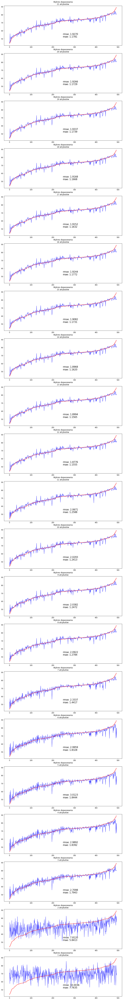

In [58]:
rforest_models = []
for i in range(len(features_relief)):
  rforest_models.append( RandomForestRegressor(n_estimators=500) )

evaluate_models(features_relief, rforest_models, model_builder=rforest_builder(), amounts=10)

Model MLP

16/16 [==============================] - 0s 1ms/step
########## AVG SCORES ########
avg rmse:   2.644 | mae:   1.872 
avg rmse:   2.707 | mae:   1.946 
avg rmse:   2.692 | mae:   1.860 
avg rmse:   2.665 | mae:   1.877 
avg rmse:   2.532 | mae:   1.787 
avg rmse:   2.511 | mae:   1.755 
avg rmse:   2.649 | mae:   1.894 
avg rmse:   2.530 | mae:   1.783 
avg rmse:   2.552 | mae:   1.802 
avg rmse:   2.502 | mae:   1.741 
avg rmse:   2.773 | mae:   1.943 
avg rmse:   2.844 | mae:   1.946 
avg rmse:   2.890 | mae:   2.026 
avg rmse:   2.948 | mae:   2.047 
avg rmse:   3.854 | mae:   2.686 
avg rmse:   4.448 | mae:   3.054 
avg rmse:   4.323 | mae:   2.965 
avg rmse:   4.320 | mae:   2.924 
avg rmse:   4.558 | mae:   3.123 
avg rmse:   7.354 | mae:   5.608 
avg rmse:   8.422 | mae:   6.746 
########## AVG SCORES ########


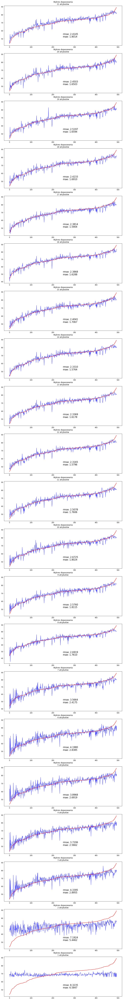

In [59]:
mlp_models = []
for i in range(len(features_relief)):
  mlp_model_t = Sequential()
  mlp_model_t.add( Dense(40, input_dim=len(features_relief)-i, activation='relu') )
  mlp_model_t.add( Dense(20, activation='linear') )
  mlp_model_t.add( Dense(20, activation='relu') )
  mlp_model_t.add( Dense(1, activation='relu') )
  mlp_model_t.compile(loss='mse', optimizer='adam')
  mlp_models.append(mlp_model_t)
  
stop_early = EarlyStopping(monitor='loss', patience=25, mode='min')
params_for_model_fitting = {'verbose':0, 'epochs':2000, 'batch_size':16, 'callbacks':[stop_early]}

evaluate_models(features_relief, mlp_models, params_for_model_fitting=params_for_model_fitting, amounts=10)

Model SVM

########## AVG SCORES ########
avg rmse:   2.325 | mae:   1.564 
avg rmse:   2.324 | mae:   1.568 
avg rmse:   2.356 | mae:   1.586 
avg rmse:   2.352 | mae:   1.584 
avg rmse:   2.351 | mae:   1.582 
avg rmse:   2.344 | mae:   1.568 
avg rmse:   2.332 | mae:   1.559 
avg rmse:   2.316 | mae:   1.542 
avg rmse:   2.296 | mae:   1.542 
avg rmse:   2.294 | mae:   1.539 
avg rmse:   2.565 | mae:   1.661 
avg rmse:   2.845 | mae:   1.833 
avg rmse:   2.827 | mae:   1.842 
avg rmse:   2.965 | mae:   1.961 
avg rmse:   3.985 | mae:   2.598 
avg rmse:   4.509 | mae:   2.999 
avg rmse:   4.594 | mae:   3.035 
avg rmse:   4.602 | mae:   3.028 
avg rmse:   4.638 | mae:   3.043 
avg rmse:   7.288 | mae:   5.341 
avg rmse:   8.296 | mae:   6.139 
########## AVG SCORES ########


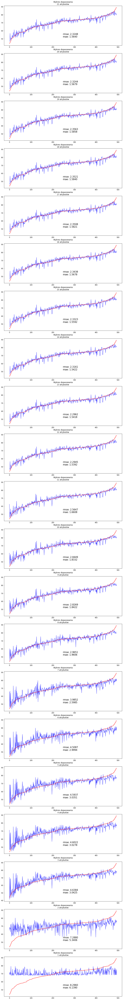

In [60]:
svm_models = []
for i in range( len(features_relief) ):
  svm_models.append( SVR(C=100, epsilon=0.9, gamma=1, kernel='rbf') )

evaluate_models(features_relief, svm_models, model_builder=svm_builder(), amounts=1)

# 1. Model drzewa decyzyjnego

Shap

In [13]:
dtree_model = pickle.load( open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_DTREE.sav', 'rb') )

In [14]:
dtree_shap_values = shap.TreeExplainer( dtree_model, Ksamples ).shap_values( Ksamples )

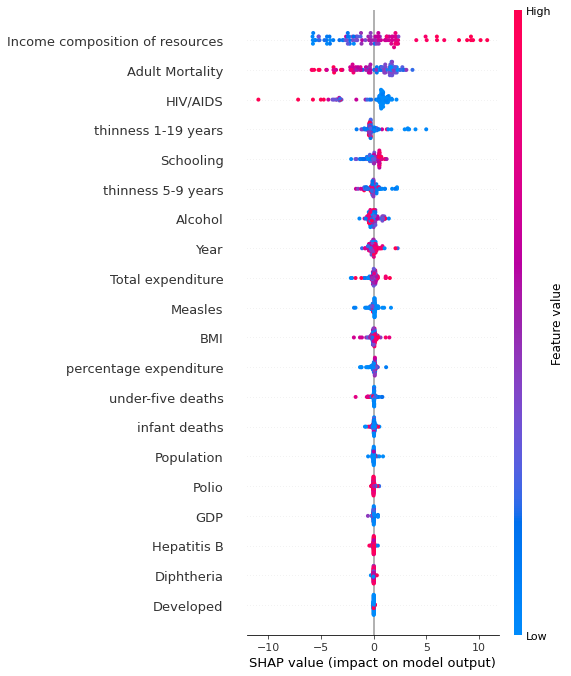

In [15]:
shap.summary_plot( dtree_shap_values, Ksamples, feature_names=x_train.columns )

In [16]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(dtree_shap_values, columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

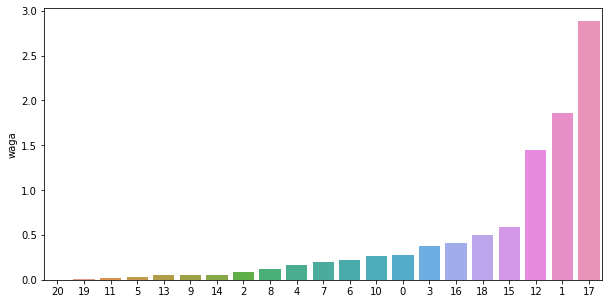

In [17]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index ]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   2.784 | mae:   1.749 
avg rmse:   2.804 | mae:   1.757 
avg rmse:   2.793 | mae:   1.753 
avg rmse:   2.752 | mae:   1.725 
avg rmse:   2.722 | mae:   1.705 
avg rmse:   2.749 | mae:   1.737 
avg rmse:   2.676 | mae:   1.675 
avg rmse:   2.709 | mae:   1.679 
avg rmse:   2.711 | mae:   1.681 
avg rmse:   2.653 | mae:   1.638 
avg rmse:   2.555 | mae:   1.556 
avg rmse:   2.511 | mae:   1.507 
avg rmse:   2.527 | mae:   1.488 
avg rmse:   2.334 | mae:   1.380 
avg rmse:   2.404 | mae:   1.437 
avg rmse:   2.505 | mae:   1.505 
avg rmse:   2.462 | mae:   1.495 
avg rmse:   2.570 | mae:   1.554 
avg rmse:   2.731 | mae:   1.690 
avg rmse:   2.915 | mae:   1.895 
avg rmse:   5.321 | mae:   3.930 
########## AVG SCORES ########


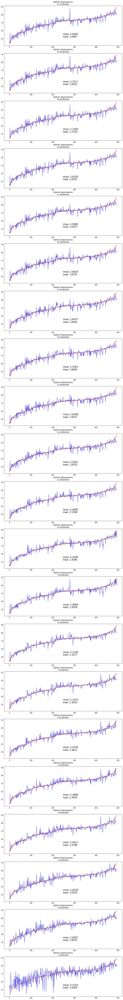

In [18]:
dtree_models = []
for i in range(len(shap_importance)):
  dtree_models.append(DecisionTreeRegressor())

evaluate_models(shap_importance, dtree_models, model_builder=dtree_builder(), amounts=10)

Morris

In [19]:
Y = dtree_model.predict(param_values)
print( Y.shape )
print( param_values.shape )

(45056,)
(45056, 21)


X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


<Figure size 1440x2880 with 0 Axes>

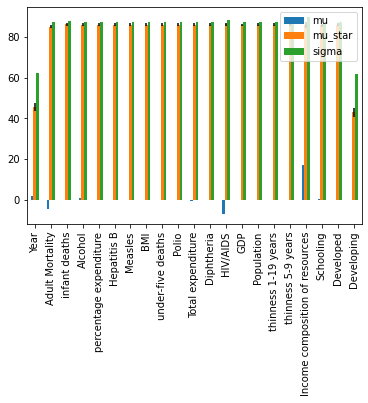

In [20]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

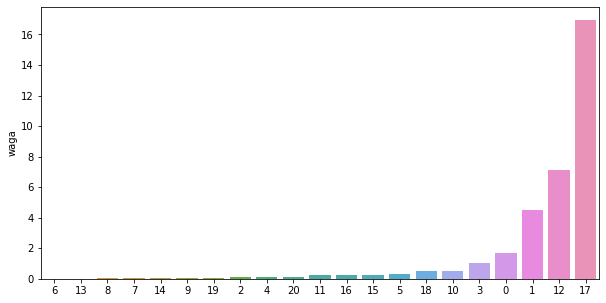

In [21]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index ]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   2.799 | mae:   1.756 
avg rmse:   2.783 | mae:   1.733 
avg rmse:   2.826 | mae:   1.754 
avg rmse:   2.817 | mae:   1.768 
avg rmse:   2.766 | mae:   1.711 
avg rmse:   2.730 | mae:   1.660 
avg rmse:   2.755 | mae:   1.683 
avg rmse:   2.742 | mae:   1.685 
avg rmse:   2.705 | mae:   1.660 
avg rmse:   2.581 | mae:   1.545 
avg rmse:   2.597 | mae:   1.564 
avg rmse:   2.608 | mae:   1.571 
avg rmse:   2.582 | mae:   1.520 
avg rmse:   2.640 | mae:   1.551 
avg rmse:   2.638 | mae:   1.535 
avg rmse:   2.586 | mae:   1.512 
avg rmse:   2.625 | mae:   1.523 
avg rmse:   2.701 | mae:   1.662 
avg rmse:   2.763 | mae:   1.723 
avg rmse:   3.946 | mae:   2.943 
avg rmse:   5.321 | mae:   3.930 
########## AVG SCORES ########


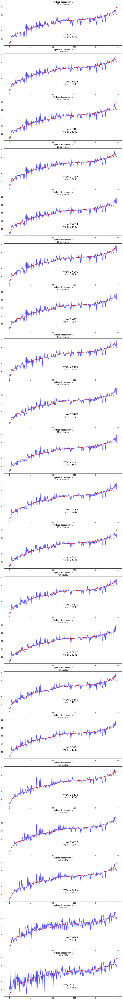

In [22]:
evaluate_models(features_morris, dtree_models, model_builder=dtree_builder(), amounts=10)

Sobol

In [23]:
Si = sobol.analyze(problem, Y)

In [24]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                                     waga
Developing                       0.000000
Measles                          0.000000
GDP                              0.000003
Polio                            0.000008
infant deaths                    0.000015
Diphtheria                       0.000162
percentage expenditure           0.000203
Hepatitis B                      0.000283
under-five deaths                0.000305
Developed                        0.000336
BMI                              0.000892
Population                       0.002436
Schooling                        0.004411
thinness 5-9 years               0.005120
thinness 1-19 years              0.005331
Alcohol                          0.006648
Total expenditure                0.012300
Year                             0.028858
Adult Mortality                  0.155264
HIV/AIDS                         0.225306
Income composition of resources  0.798387


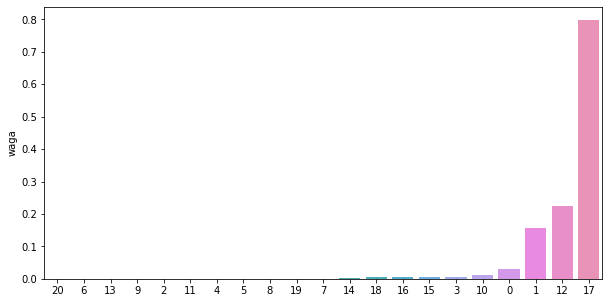

In [25]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index ]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   2.779 | mae:   1.738 
avg rmse:   2.775 | mae:   1.746 
avg rmse:   2.752 | mae:   1.712 
avg rmse:   2.826 | mae:   1.767 
avg rmse:   2.840 | mae:   1.774 
avg rmse:   2.801 | mae:   1.763 
avg rmse:   2.811 | mae:   1.770 
avg rmse:   2.736 | mae:   1.689 
avg rmse:   2.664 | mae:   1.614 
avg rmse:   2.654 | mae:   1.648 
avg rmse:   2.644 | mae:   1.658 
avg rmse:   2.646 | mae:   1.615 
avg rmse:   2.506 | mae:   1.482 
avg rmse:   2.523 | mae:   1.479 
avg rmse:   2.500 | mae:   1.452 
avg rmse:   2.600 | mae:   1.511 
avg rmse:   2.768 | mae:   1.704 
avg rmse:   2.728 | mae:   1.672 
avg rmse:   2.753 | mae:   1.715 
avg rmse:   3.945 | mae:   2.941 
avg rmse:   5.321 | mae:   3.930 
########## AVG SCORES ########


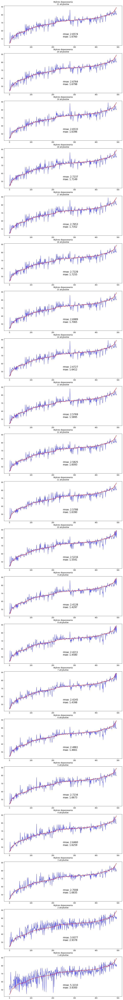

In [26]:
evaluate_models(features_sobol, dtree_models, model_builder=dtree_builder(), amounts=10)

# 1. Regresjia liniowa (pominięte)

In [ ]:
linear_model = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_LINEARREG.sav', 'rb'))

In [ ]:
linear_explainer = shap.KernelExplainer(linear_model.predict, Ksamples_lin)
linear_shap_values = linear_explainer.shap_values(Ksamples_lin)

  0%|          | 0/100 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

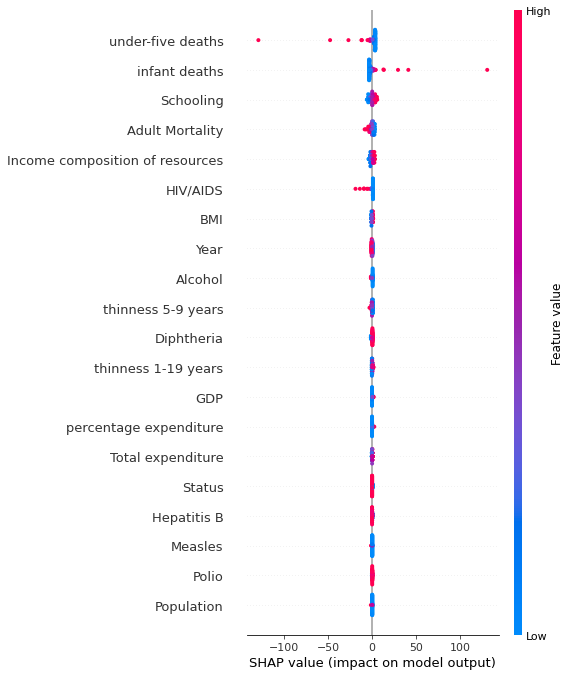

In [ ]:
shap.summary_plot(linear_shap_values, Ksamples_lin, feature_names=x_train.columns)

Budowanie nowych modeli

In [ ]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(linear_shap_values, columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'importance'] )
shap_importance.sort_values('importance', ascending=True, inplace=True)

#print(shap_importance.head())
columns_to_drop = shap_importance.iloc[:-1]['name']

In [ ]:
x_train_copy = x_train.copy()
x_test_copy = x_test.copy()
for col in columns_to_drop:
  x_train_copy.drop(col, axis=1, inplace=True)
  x_test_copy.drop(col, axis=1, inplace=True)
  model = LinearRegression()
  model.fit(x_train_copy, y_train)

  y_pred = model.predict(x_test_copy)
  print( np.sqrt(mean_squared_error(y_test, y_pred)) )


3.464859750147297
3.466590567217716
3.467703426715057
3.461769169875956
3.476750969557406
3.480818847298289
3.486782286943018
3.5799379843099235
3.5786724313554625
3.5961246803843614
3.6032770532434957
3.603873921133587
3.6206287557105044
3.627266409960073
4.245165122976952
4.47464011686411
5.826367397990365
8.159957397623293
8.392345988660178


# 2. Randomowe Lasy

In [27]:
rforest_model = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_RFOREST.sav', 'rb'))

Shap

In [28]:
rforest_exlpainer = shap.TreeExplainer(rforest_model, Ksamples)
rforest_shap_values = rforest_exlpainer.shap_values(Ksamples)

 95%|=================== | 95/100 [00:16<00:00]       

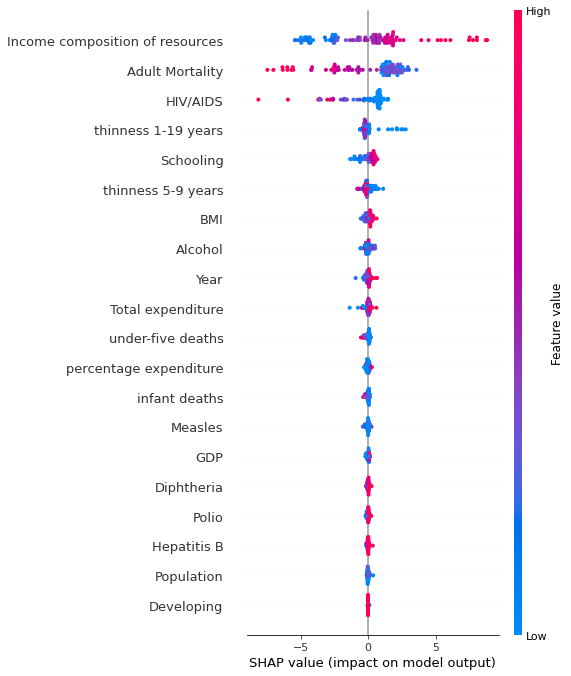

In [29]:
shap.summary_plot(rforest_shap_values, Ksamples, feature_names=x_train.columns)

In [30]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(rforest_shap_values, columns = feature_names )
vals = np.abs(shap_values_df.values).mean(0)

shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

print(shap_importance.head())

                 waga
name                 
Developed    0.003499
Developing   0.004018
Population   0.034079
Hepatitis B  0.036604
Polio        0.040847


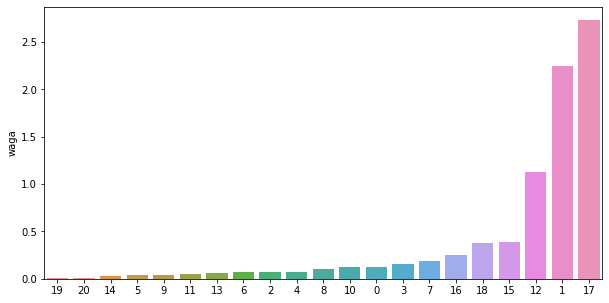

In [31]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index ]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   1.937 | mae:   1.180 
avg rmse:   1.933 | mae:   1.180 
avg rmse:   1.940 | mae:   1.184 
avg rmse:   1.921 | mae:   1.162 
avg rmse:   1.921 | mae:   1.162 
avg rmse:   1.916 | mae:   1.154 
avg rmse:   1.912 | mae:   1.155 
avg rmse:   1.908 | mae:   1.155 
avg rmse:   1.909 | mae:   1.151 
avg rmse:   1.913 | mae:   1.157 
avg rmse:   1.895 | mae:   1.139 
avg rmse:   1.898 | mae:   1.155 
avg rmse:   1.891 | mae:   1.153 
avg rmse:   1.894 | mae:   1.159 
avg rmse:   1.936 | mae:   1.172 
avg rmse:   1.938 | mae:   1.186 
avg rmse:   1.952 | mae:   1.184 
avg rmse:   1.995 | mae:   1.231 
avg rmse:   2.215 | mae:   1.425 
avg rmse:   2.436 | mae:   1.606 
avg rmse:   4.816 | mae:   3.629 
########## AVG SCORES ########


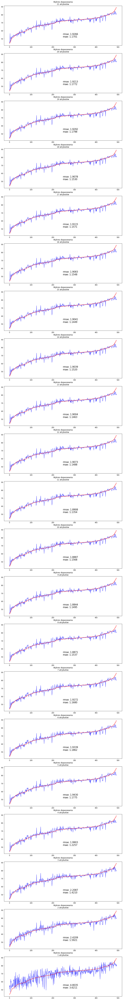

In [32]:
rforest_models = []
for i in range( len(shap_importance) ):
  rforest_models.append( RandomForestRegressor(n_estimators=1) )

evaluate_models(shap_importance, rforest_models, model_builder=rforest_builder(), amounts=10)

Morris

In [33]:
Y = rforest_model.predict(param_values)

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


<Figure size 1440x2880 with 0 Axes>

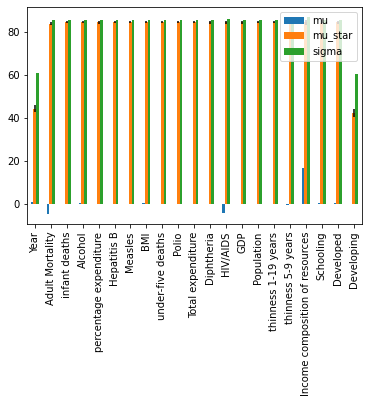

In [34]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

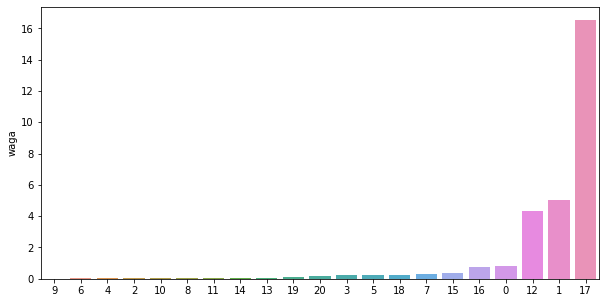

In [35]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   1.935 | mae:   1.178 
avg rmse:   1.936 | mae:   1.177 
avg rmse:   1.941 | mae:   1.177 
avg rmse:   1.930 | mae:   1.167 
avg rmse:   1.929 | mae:   1.169 
avg rmse:   1.925 | mae:   1.173 
avg rmse:   1.940 | mae:   1.193 
avg rmse:   1.940 | mae:   1.194 
avg rmse:   1.914 | mae:   1.168 
avg rmse:   1.903 | mae:   1.160 
avg rmse:   1.908 | mae:   1.162 
avg rmse:   1.901 | mae:   1.157 
avg rmse:   1.937 | mae:   1.167 
avg rmse:   1.930 | mae:   1.166 
avg rmse:   1.955 | mae:   1.188 
avg rmse:   1.932 | mae:   1.200 
avg rmse:   1.972 | mae:   1.219 
avg rmse:   2.181 | mae:   1.393 
avg rmse:   2.216 | mae:   1.426 
avg rmse:   2.437 | mae:   1.605 
avg rmse:   4.819 | mae:   3.631 
########## AVG SCORES ########


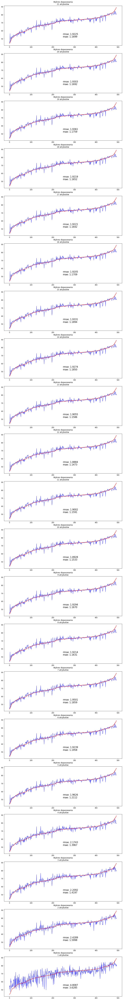

In [36]:
evaluate_models(features_morris, rforest_models, model_builder=rforest_builder(), amounts=10)

Sobol

In [37]:
Si = sobol.analyze(problem, Y)

In [38]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                                         waga
Developing                       3.961361e-07
Measles                          9.143346e-07
Developed                        1.027941e-06
GDP                              1.937958e-06
infant deaths                    7.387615e-06
under-five deaths                1.021183e-05
Hepatitis B                      1.105583e-05
Diphtheria                       2.213150e-05
percentage expenditure           3.170103e-05
Polio                            4.190503e-05
Population                       4.926318e-05
Alcohol                          4.169538e-04
BMI                              4.881841e-04
Total expenditure                6.480626e-04
Schooling                        7.259627e-04
thinness 5-9 years               1.607266e-03
Year                             3.236234e-03
thinness 1-19 years              3.379278e-03
HIV/AIDS                         8.817780e-02
Adult Mortality                  1.175684e-01
Income composition of resources  8

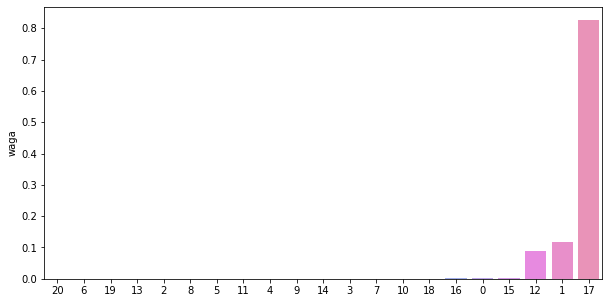

In [39]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   1.936 | mae:   1.179 
avg rmse:   1.936 | mae:   1.177 
avg rmse:   1.940 | mae:   1.178 
avg rmse:   1.939 | mae:   1.177 
avg rmse:   1.934 | mae:   1.177 
avg rmse:   1.939 | mae:   1.181 
avg rmse:   1.943 | mae:   1.197 
avg rmse:   1.939 | mae:   1.193 
avg rmse:   1.932 | mae:   1.190 
avg rmse:   1.917 | mae:   1.178 
avg rmse:   1.928 | mae:   1.181 
avg rmse:   1.897 | mae:   1.157 
avg rmse:   1.929 | mae:   1.164 
avg rmse:   1.899 | mae:   1.153 
avg rmse:   1.907 | mae:   1.169 
avg rmse:   1.938 | mae:   1.204 
avg rmse:   1.955 | mae:   1.206 
avg rmse:   1.992 | mae:   1.225 
avg rmse:   2.215 | mae:   1.426 
avg rmse:   2.437 | mae:   1.605 
avg rmse:   4.825 | mae:   3.633 
########## AVG SCORES ########


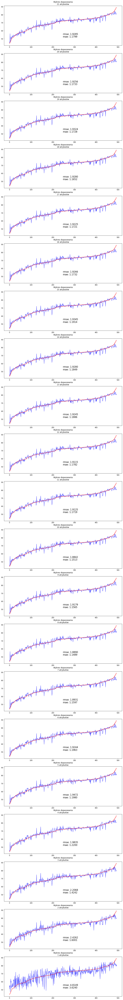

In [40]:
evaluate_models(features_sobol, rforest_models, model_builder=rforest_builder(), amounts=10)

# 3. MLP

In [12]:
mlp_model = keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_MLP')

Shap

In [14]:
mlp_explainer = shap.KernelExplainer(mlp_model, Ksamples)
mlp_shap_values = mlp_explainer.shap_values(Ksamples)

  0%|          | 0/100 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

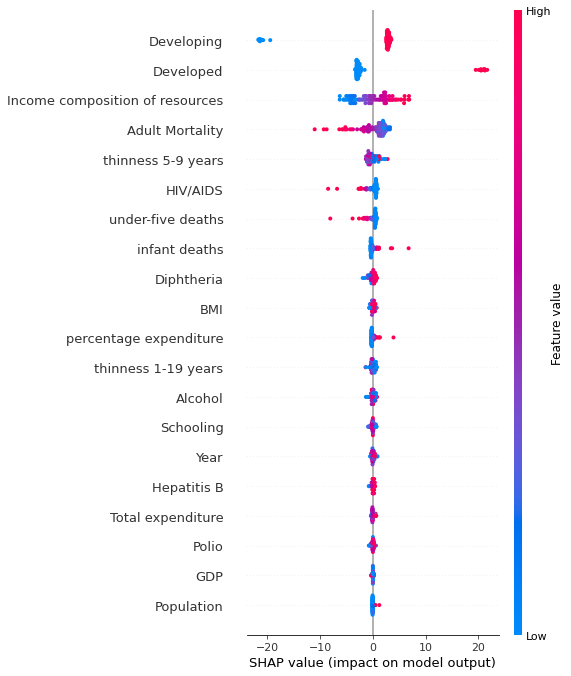

In [15]:
shap.summary_plot(mlp_shap_values[0], Ksamples, feature_names=x_train.columns)

In [16]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(mlp_shap_values[0], columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

print(shap_importance.head())

                       waga
name                       
Measles            0.034613
Population         0.066476
GDP                0.066718
Polio              0.149119
Total expenditure  0.153163


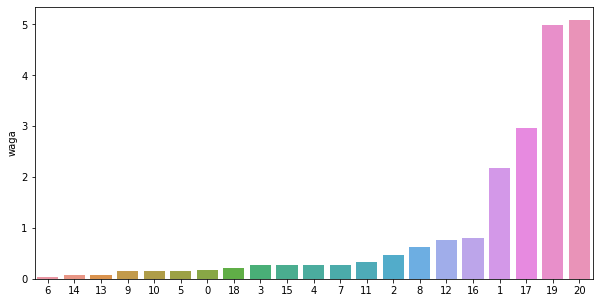

In [17]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

16/16 [==============================] - 0s 2ms/step
########## AVG SCORES ########
avg rmse:   2.637 | mae:   1.850 
avg rmse:   2.636 | mae:   1.826 
avg rmse:   2.600 | mae:   1.856 
avg rmse:   2.611 | mae:   1.886 
avg rmse:   2.574 | mae:   1.802 
avg rmse:   2.513 | mae:   1.760 
avg rmse:   2.578 | mae:   1.795 
avg rmse:   2.442 | mae:   1.704 
avg rmse:   2.526 | mae:   1.749 
avg rmse:   2.426 | mae:   1.683 
avg rmse:   2.645 | mae:   1.876 
avg rmse:   2.580 | mae:   1.837 
avg rmse:   2.543 | mae:   1.732 
avg rmse:   2.516 | mae:   1.785 
avg rmse:   2.499 | mae:   1.769 
avg rmse:   2.553 | mae:   1.787 
avg rmse:   2.745 | mae:   1.896 
avg rmse:   3.130 | mae:   2.220 
avg rmse:   4.486 | mae:   3.360 
avg rmse:   7.787 | mae:   6.279 
avg rmse:   7.744 | mae:   6.235 
########## AVG SCORES ########


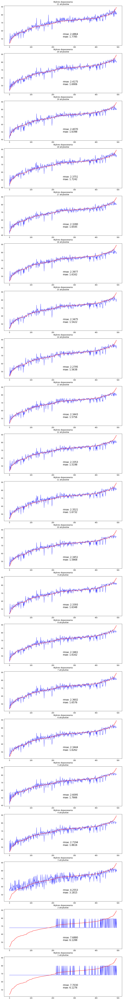

In [18]:
mlp_models = []
for i in range(len(shap_importance)):
  mlp_model_t = Sequential()
  mlp_model_t.add( Dense(40, input_dim=len(shap_importance)-i, activation='relu') )
  mlp_model_t.add( Dense(20, activation='linear') )
  mlp_model_t.add( Dense(20, activation='relu') )
  mlp_model_t.add( Dense(1, activation='relu') )
  mlp_model_t.compile(loss='mse', optimizer='adam')
  mlp_models.append(mlp_model_t)
  
stop_early = EarlyStopping(monitor='loss', patience=25, mode='min')
params_for_model_fitting = {'verbose':0, 'epochs':2000, 'batch_size':16, 'callbacks':[stop_early]}

evaluate_models(shap_importance, mlp_models, params_for_model_fitting, amounts=10)

Morris

In [13]:
Y = mlp_model.predict(param_values)

1408/1408 [==============================] - 3s 2ms/step


<Figure size 1440x2880 with 0 Axes>

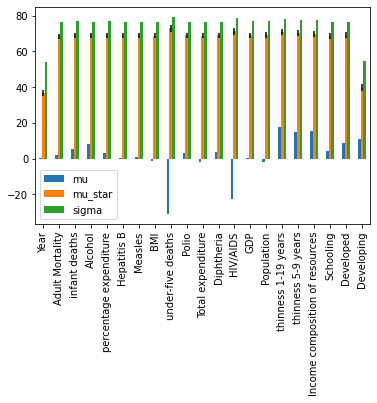

In [20]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

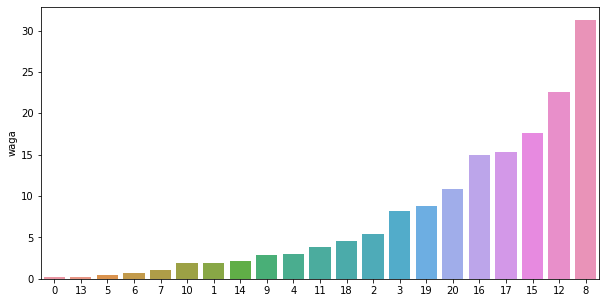

In [21]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

16/16 [==============================] - 0s 2ms/step
########## AVG SCORES ########
avg rmse:   2.592 | mae:   1.788 
avg rmse:   2.574 | mae:   1.748 
avg rmse:   2.536 | mae:   1.752 
avg rmse:   2.694 | mae:   1.912 
avg rmse:   2.532 | mae:   1.784 
avg rmse:   2.473 | mae:   1.721 
avg rmse:   2.453 | mae:   1.727 
avg rmse:   2.831 | mae:   2.077 
avg rmse:   2.794 | mae:   2.060 
avg rmse:   2.776 | mae:   2.034 
avg rmse:   2.856 | mae:   2.093 
avg rmse:   2.850 | mae:   2.107 
avg rmse:   2.964 | mae:   2.182 
avg rmse:   2.981 | mae:   2.201 
avg rmse:   3.076 | mae:   2.307 
avg rmse:   3.067 | mae:   2.307 
avg rmse:   3.017 | mae:   2.234 
avg rmse:   3.025 | mae:   2.283 
avg rmse:   4.022 | mae:   3.036 
avg rmse:   4.707 | mae:   3.590 
avg rmse:   7.335 | mae:   5.759 
########## AVG SCORES ########


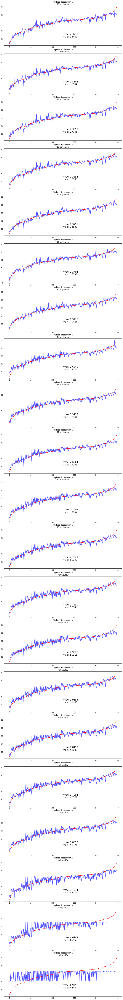

In [22]:
mlp_models = []
for i in range(len(features_morris)):
  mlp_model_t = Sequential()
  mlp_model_t.add( Dense(40, input_dim=len(features_morris)-i, activation='relu') )
  mlp_model_t.add( Dense(20, activation='linear') )
  mlp_model_t.add( Dense(20, activation='relu') )
  mlp_model_t.add( Dense(1, activation='relu') )
  mlp_model_t.compile(loss='mse', optimizer='adam')
  mlp_models.append(mlp_model_t)

stop_early = EarlyStopping(monitor='loss', patience=25, mode='min')
params_for_model_fitting = {'verbose':0, 'epochs':2000, 'batch_size':16, 'callbacks':[stop_early]}

evaluate_models(features_morris, mlp_models, params_for_model_fitting, amounts=10)

Sobol

In [14]:
Y = Y.ravel()
Si = sobol.analyze(problem, Y)

In [15]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                                     waga
Hepatitis B                      0.000678
Year                             0.000758
Total expenditure                0.002622
Measles                          0.002947
BMI                              0.002983
Polio                            0.003425
Diphtheria                       0.005178
GDP                              0.012744
Schooling                        0.015859
Population                       0.024420
Adult Mortality                  0.027252
percentage expenditure           0.029542
Developed                        0.032577
Alcohol                          0.033307
infant deaths                    0.044464
Developing                       0.059739
Income composition of resources  0.097829
thinness 5-9 years               0.123256
thinness 1-19 years              0.159270
HIV/AIDS                         0.211468
under-five deaths                0.350192


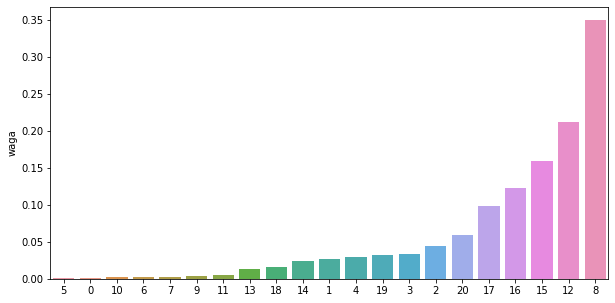

In [16]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

16/16 [==============================] - 0s 2ms/step
########## AVG SCORES ########
avg rmse:   2.643 | mae:   1.811 
avg rmse:   2.556 | mae:   1.744 
avg rmse:   2.526 | mae:   1.763 
avg rmse:   2.550 | mae:   1.730 
avg rmse:   2.460 | mae:   1.670 
avg rmse:   2.556 | mae:   1.817 
avg rmse:   2.565 | mae:   1.762 
avg rmse:   2.435 | mae:   1.667 
avg rmse:   2.429 | mae:   1.659 
avg rmse:   2.465 | mae:   1.735 
avg rmse:   2.441 | mae:   1.693 
avg rmse:   2.860 | mae:   2.120 
avg rmse:   2.911 | mae:   2.142 
avg rmse:   2.938 | mae:   2.179 
avg rmse:   3.088 | mae:   2.318 
avg rmse:   3.041 | mae:   2.277 
avg rmse:   2.952 | mae:   2.191 
avg rmse:   3.817 | mae:   2.846 
avg rmse:   3.850 | mae:   2.896 
avg rmse:   4.767 | mae:   3.647 
avg rmse:   7.155 | mae:   5.600 
########## AVG SCORES ########


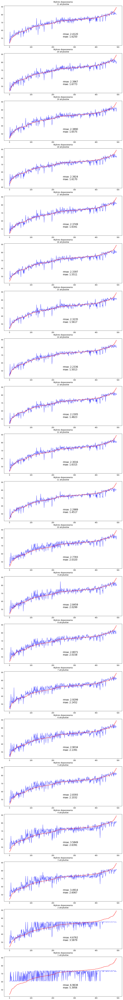

In [17]:
mlp_models = []
for i in range(len(features_sobol)):
  mlp_model_t = Sequential()
  mlp_model_t.add( Dense(40, input_dim=len(features_sobol)-i, activation='relu') )
  mlp_model_t.add( Dense(20, activation='linear') )
  mlp_model_t.add( Dense(20, activation='relu') )
  mlp_model_t.add( Dense(1, activation='relu') )
  mlp_model_t.compile(loss='mse', optimizer='adam')
  mlp_models.append(mlp_model_t)

stop_early = EarlyStopping(monitor='loss', patience=25, mode='min')
params_for_model_fitting = {'verbose':0, 'epochs':2000, 'batch_size':16, 'callbacks':[stop_early]}

evaluate_models(features_sobol, mlp_models, params_for_model_fitting, amounts=10)

# 4. SVM

In [41]:
svm_model = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/LifeModels/LifeExpectancy_SVM.sav', 'rb'))

Shap

In [42]:
svm_explainer = shap.KernelExplainer(svm_model.predict, Ksamples)
svm_shap_values = svm_explainer.shap_values(Ksamples)

  0%|          | 0/100 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

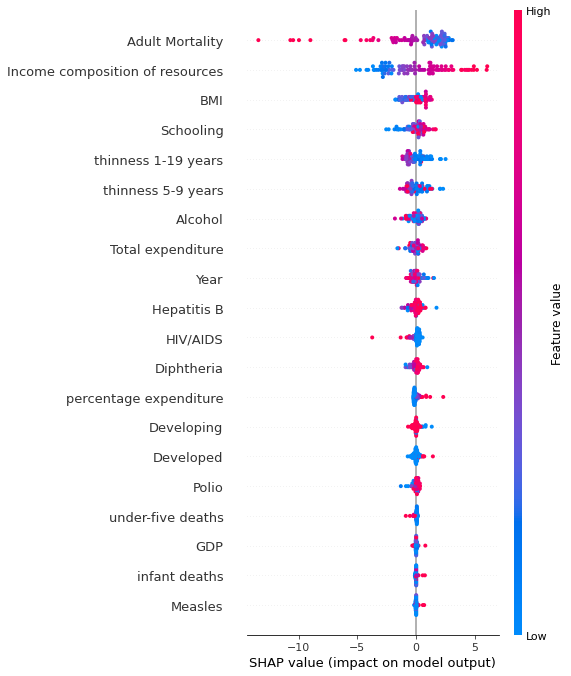

In [43]:
shap.summary_plot(svm_shap_values, Ksamples, feature_names=x_train.columns)

In [44]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(svm_shap_values, columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

print(shap_importance.head())

                       waga
name                       
Population         0.015491
Measles            0.038586
infant deaths      0.039088
GDP                0.053638
under-five deaths  0.075751


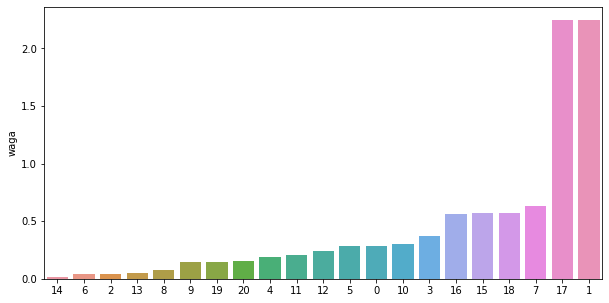

In [45]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   2.325 | mae:   1.564 
avg rmse:   2.320 | mae:   1.562 
avg rmse:   2.272 | mae:   1.538 
avg rmse:   2.269 | mae:   1.534 
avg rmse:   2.257 | mae:   1.530 
avg rmse:   2.273 | mae:   1.548 
avg rmse:   2.240 | mae:   1.524 
avg rmse:   2.240 | mae:   1.525 
avg rmse:   2.270 | mae:   1.535 
avg rmse:   2.243 | mae:   1.511 
avg rmse:   2.245 | mae:   1.510 
avg rmse:   2.520 | mae:   1.643 
avg rmse:   2.611 | mae:   1.661 
avg rmse:   2.596 | mae:   1.655 
avg rmse:   2.659 | mae:   1.724 
avg rmse:   2.791 | mae:   1.846 
avg rmse:   2.827 | mae:   1.866 
avg rmse:   2.946 | mae:   1.964 
avg rmse:   2.948 | mae:   1.983 
avg rmse:   3.053 | mae:   2.055 
avg rmse:   5.489 | mae:   3.541 
########## AVG SCORES ########


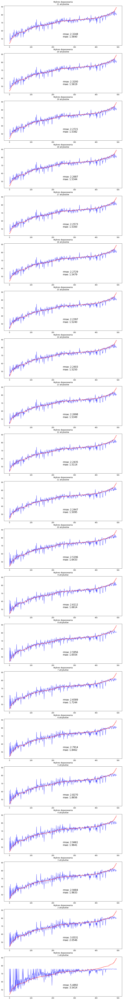

In [46]:
svm_models = []
for i in range( len(shap_importance) ):
  svm_models.append( SVR(C=100, epsilon=0.9, gamma=1, kernel='rbf') )

evaluate_models(shap_importance, svm_models, model_builder=svm_builder(), amounts=1)

Analiza metodą Morris

In [47]:
Y = svm_model.predict(param_values)

<Figure size 1440x2880 with 0 Axes>

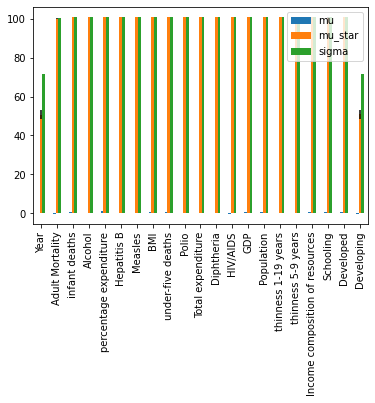

In [48]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

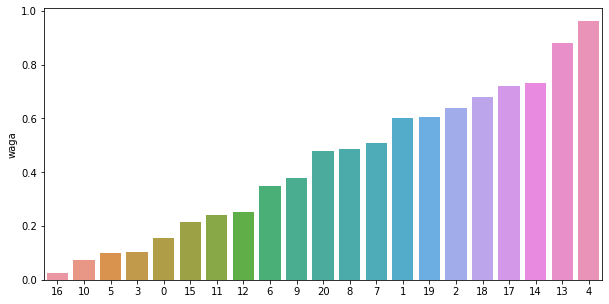

In [49]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   2.325 | mae:   1.564 
avg rmse:   2.355 | mae:   1.597 
avg rmse:   2.382 | mae:   1.630 
avg rmse:   2.356 | mae:   1.563 
avg rmse:   2.415 | mae:   1.595 
avg rmse:   2.411 | mae:   1.566 
avg rmse:   2.543 | mae:   1.750 
avg rmse:   2.519 | mae:   1.728 
avg rmse:   2.836 | mae:   1.905 
avg rmse:   2.804 | mae:   1.875 
avg rmse:   2.850 | mae:   1.910 
avg rmse:   2.846 | mae:   1.903 
avg rmse:   2.855 | mae:   1.905 
avg rmse:   2.905 | mae:   1.944 
avg rmse:   3.916 | mae:   2.840 
avg rmse:   3.930 | mae:   2.874 
avg rmse:   3.987 | mae:   2.905 
avg rmse:   4.290 | mae:   3.155 
avg rmse:   7.193 | mae:   5.431 
avg rmse:   7.174 | mae:   5.445 
avg rmse:   7.305 | mae:   5.507 
########## AVG SCORES ########


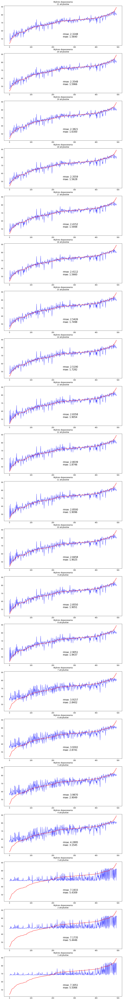

In [50]:
evaluate_models(features_morris, svm_models, model_builder=svm_builder(), amounts=1)

Analiza metodą Sobol

In [51]:
Si = sobol.analyze(problem, Y)

In [52]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                                     waga
Total expenditure                0.022158
Year                             0.025234
thinness 5-9 years               0.025556
Diphtheria                       0.028284
Hepatitis B                      0.030472
Alcohol                          0.030704
thinness 1-19 years              0.036099
Polio                            0.039328
Measles                          0.044468
HIV/AIDS                         0.052610
BMI                              0.064766
under-five deaths                0.075727
Developing                       0.086585
Schooling                        0.093955
infant deaths                    0.098753
Developed                        0.100735
Adult Mortality                  0.112315
Income composition of resources  0.122283
Population                       0.137772
GDP                              0.140307
percentage expenditure           0.172353


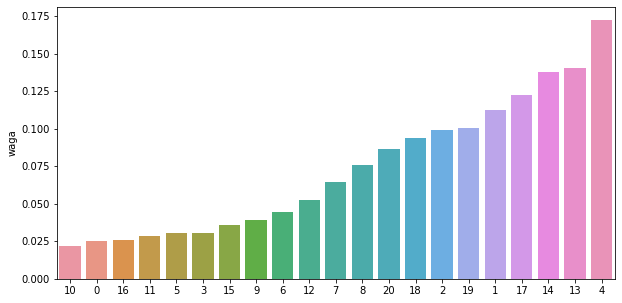

In [53]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:   2.325 | mae:   1.564 
avg rmse:   2.363 | mae:   1.612 
avg rmse:   2.347 | mae:   1.604 
avg rmse:   2.368 | mae:   1.625 
avg rmse:   2.357 | mae:   1.597 
avg rmse:   2.340 | mae:   1.567 
avg rmse:   2.375 | mae:   1.554 
avg rmse:   2.519 | mae:   1.728 
avg rmse:   2.580 | mae:   1.761 
avg rmse:   2.524 | mae:   1.724 
avg rmse:   2.850 | mae:   1.910 
avg rmse:   2.878 | mae:   1.940 
avg rmse:   2.906 | mae:   1.948 
avg rmse:   2.905 | mae:   1.944 
avg rmse:   2.958 | mae:   1.981 
avg rmse:   2.967 | mae:   1.988 
avg rmse:   2.992 | mae:   2.000 
avg rmse:   4.290 | mae:   3.155 
avg rmse:   7.193 | mae:   5.431 
avg rmse:   7.174 | mae:   5.445 
avg rmse:   7.305 | mae:   5.507 
########## AVG SCORES ########


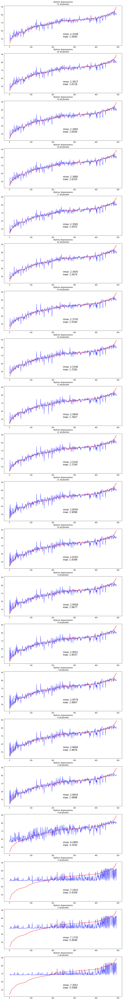

In [54]:
evaluate_models(features_sobol, svm_models, model_builder=svm_builder(), amounts=1)